In [1]:
import os
import stitching
import cv2
import matplotlib.pyplot as plt
import numpy as np

from stitching.image_handler import ImageHandler
from stitching.feature_detector import FeatureDetector
from stitching.feature_matcher import FeatureMatcher
from stitching.subsetter import Subsetter
from stitching.camera_estimator import CameraEstimator
from stitching.camera_adjuster import CameraAdjuster
from stitching.camera_wave_corrector import WaveCorrector
from stitching.warper import Warper
from stitching.cropper import Cropper
from stitching.seam_finder import SeamFinder
from stitching.exposure_error_compensator import ExposureErrorCompensator
from stitching.blender import Blender
from stitching.timelapser import Timelapser

In [2]:
ROOT_PATH = os.path.dirname(os.getcwd())
DATA_PATH = os.path.join(ROOT_PATH, "data")

In [3]:
left_test_image_path = os.path.join(DATA_PATH, "keparoi_left_frame_aligned.jpg")
right_test_image_path = os.path.join(DATA_PATH, "keparoi_right_frame_aligned.jpg")

In [4]:
real_K = np.load(os.path.join(DATA_PATH, "camera_matrix.npy"))
print(real_K)

[[2.35488254e+03 0.00000000e+00 1.99661404e+03]
 [0.00000000e+00 2.33654802e+03 1.49442413e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


In [5]:
# spherical, paniniA2B1, mercator
stitcher = stitching.Stitcher(blend_strength=20, try_use_gpu=True, warper_type="mercator")
panorama = stitcher.stitch([left_test_image_path, right_test_image_path])

In [6]:
print(panorama.shape)

(1753, 4941, 3)


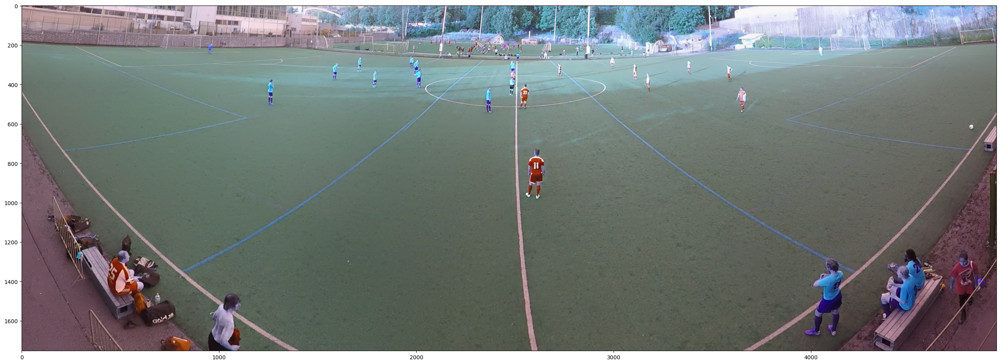

In [7]:
plt.figure(figsize=(32,32))
plt.imshow(panorama)
plt.show()

## Test tutorial

In [8]:
def plot_image(img, figsize_in_inches=(5,5)):
    fig, ax = plt.subplots(figsize=figsize_in_inches)
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

    
def plot_images(imgs, figsize_in_inches=(5,5)):
    fig, axs = plt.subplots(1, len(imgs), figsize=figsize_in_inches)
    for col, img in enumerate(imgs):
        axs[col].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

In [9]:
image_names = [left_test_image_path, right_test_image_path]

In [10]:
img_handler = ImageHandler()
img_handler.set_img_names(image_names)

medium_imgs = list(img_handler.resize_to_medium_resolution())
low_imgs = list(img_handler.resize_to_low_resolution(medium_imgs))
final_imgs = list(img_handler.resize_to_final_resolution())

In [11]:
finder = FeatureDetector(detector="sift")
features = [finder.detect_features(img) for img in medium_imgs]
keypoints_center_img = finder.draw_keypoints(medium_imgs[1], features[1])

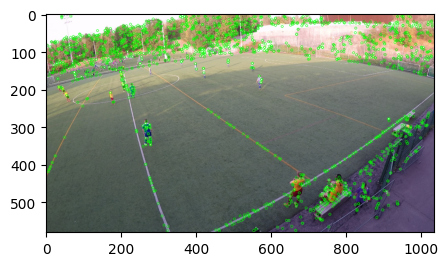

In [12]:
plot_image(keypoints_center_img)

In [13]:
matcher = FeatureMatcher()
matches = matcher.match_features(features)
print(matcher.get_confidence_matrix(matches))

[[0.         1.90802348]
 [1.90802348 0.        ]]


Matches Image 1 to Image 2


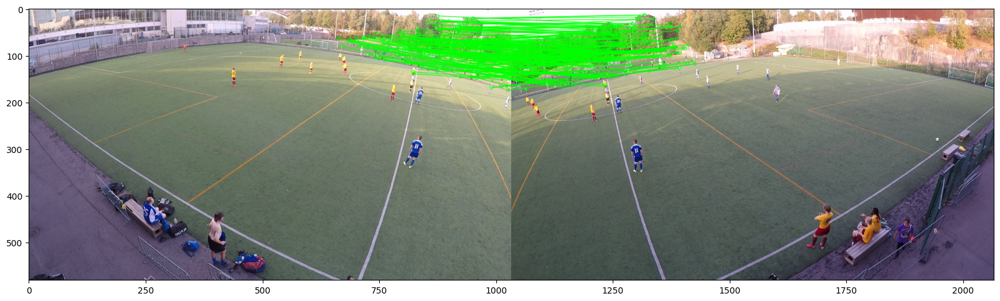

In [14]:
all_relevant_matches = matcher.draw_matches_matrix(medium_imgs, features, matches, conf_thresh=1, 
                                                   inliers=True, matchColor=(0, 255, 0))

for idx1, idx2, img in all_relevant_matches:
    print(f"Matches Image {idx1+1} to Image {idx2+1}")
    plot_image(img, (20,10))

In [15]:
subsetter = Subsetter()

indices = subsetter.get_indices_to_keep(features, matches)

medium_imgs = subsetter.subset_list(medium_imgs, indices)
low_imgs = subsetter.subset_list(low_imgs, indices)
final_imgs = subsetter.subset_list(final_imgs, indices)
features = subsetter.subset_list(features, indices)
matches = subsetter.subset_matches(matches, indices)

img_names = subsetter.subset_list(img_handler.img_names, indices)
img_sizes = subsetter.subset_list(img_handler.img_sizes, indices)

img_handler.img_names, img_handler.img_sizes = img_names, img_sizes

In [16]:
camera_estimator = CameraEstimator()
camera_adjuster = CameraAdjuster()
wave_corrector = WaveCorrector(wave_correct_kind="horiz")

cameras = camera_estimator.estimate(features, matches)
cameras = camera_adjuster.adjust(features, matches, cameras)
cameras = wave_corrector.correct(cameras)

In [17]:
cameras[0].R

array([[ 9.7128195e-01,  1.9791205e-01, -1.3206847e-01],
       [ 1.6962378e-08,  5.5506992e-01,  8.3180374e-01],
       [ 2.3793121e-01, -8.0791599e-01,  5.3912944e-01]], dtype=float32)

In [18]:
@staticmethod
def get_K(camera, aspect=1):
    K = np.array([[2350,0,w/2],[0,2350,h/2],[0,0,1]])
    """ Modification of intrinsic parameters needed if cameras were
    obtained on different scale than the scale of the Images which should
    be warped """
    K[0, 0] *= aspect
    K[0, 2] *= aspect
    K[1, 1] *= aspect
    K[1, 2] *= aspect
    return 

In [19]:
warper = Warper(warper_type="mercator")
warper.get_K = get_K

warper.set_scale(cameras)

In [20]:
low_sizes = img_handler.get_low_img_sizes()
camera_aspect = img_handler.get_medium_to_low_ratio()      # since cameras were obtained on medium imgs

warped_low_imgs = list(warper.warp_images(low_imgs, cameras, camera_aspect))
warped_low_masks = list(warper.create_and_warp_masks(low_sizes, cameras, camera_aspect))
low_corners, low_sizes = warper.warp_rois(low_sizes, cameras, camera_aspect)

In [21]:
final_sizes = img_handler.get_final_img_sizes()
camera_aspect = img_handler.get_medium_to_final_ratio()    # since cameras were obtained on medium imgs

warped_final_imgs = list(warper.warp_images(final_imgs, cameras, camera_aspect))
warped_final_masks = list(warper.create_and_warp_masks(final_sizes, cameras, camera_aspect))
final_corners, final_sizes = warper.warp_rois(final_sizes, cameras, camera_aspect)

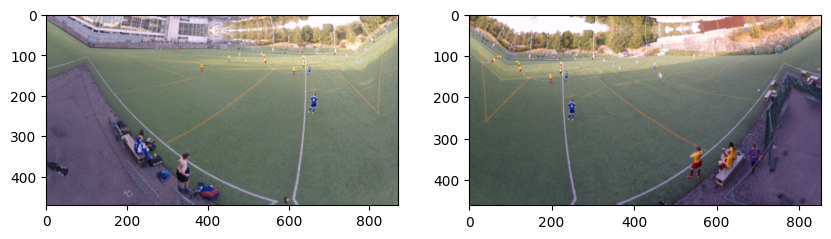

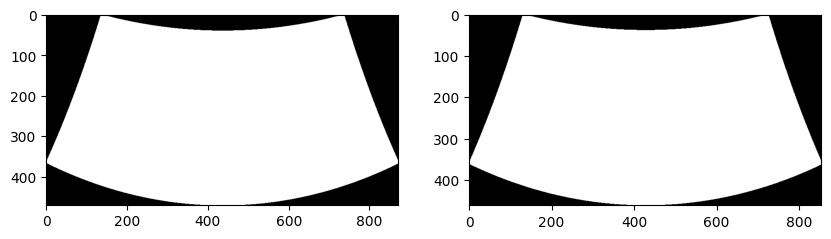

In [22]:
plot_images(warped_low_imgs, (10,10))
plot_images(warped_low_masks, (10,10))

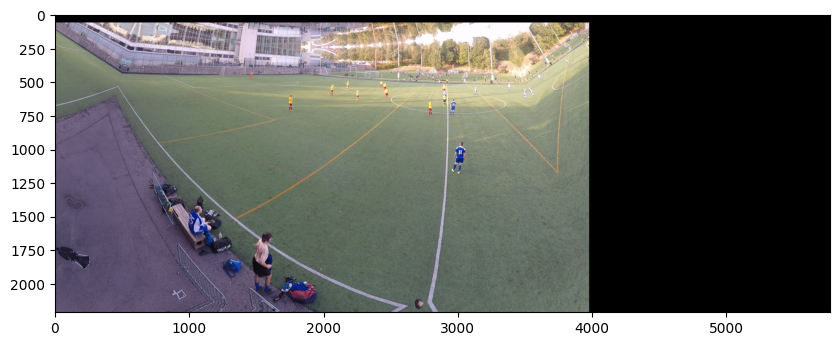

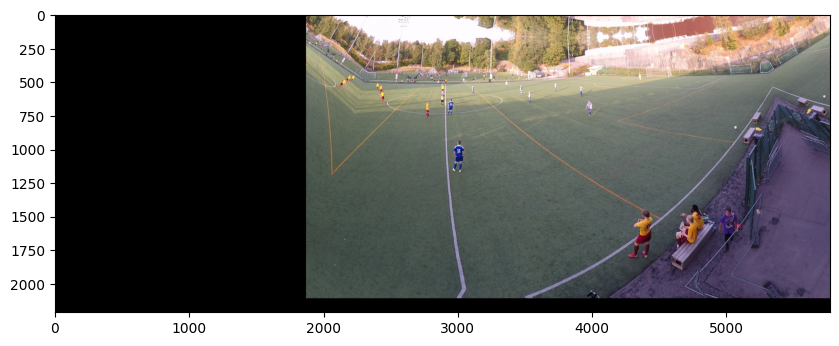

In [23]:
timelapser = Timelapser('as_is')
timelapser.initialize(final_corners, final_sizes)

for img, corner in zip(warped_final_imgs, final_corners):
    timelapser.process_frame(img, corner)
    frame = timelapser.get_frame()
    plot_image(frame, (10,10))

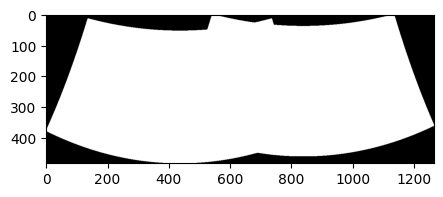

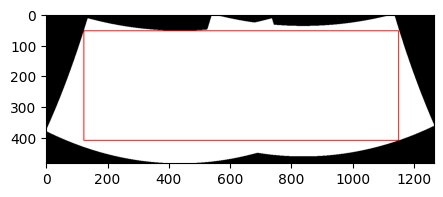

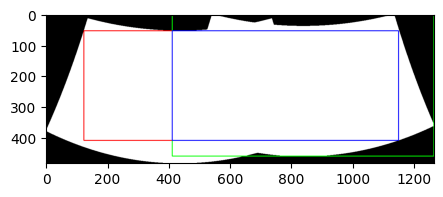

In [24]:
cropper = Cropper()

mask = cropper.estimate_panorama_mask(warped_low_imgs, warped_low_masks, low_corners, low_sizes)
plot_image(mask, (5,5))
lir = cropper.estimate_largest_interior_rectangle(mask)

lir_on_mask = lir.draw_on(mask, size=2)
plot_image(lir_on_mask, (5,5))

low_corners = cropper.get_zero_center_corners(low_corners)
rectangles = cropper.get_rectangles(low_corners, low_sizes)

rectangles_plot = rectangles[1].draw_on(lir_on_mask, (0, 255, 0), 2)  # The rectangle of the center img

overlap = cropper.get_overlap(rectangles[1], lir)

plot = overlap.draw_on(rectangles_plot, (255, 0, 0), 2)
plot_image(plot, (5,5))

intersection = cropper.get_intersection(rectangles[1], overlap)

In [25]:
cropper.prepare(warped_low_imgs, warped_low_masks, low_corners, low_sizes)

cropped_low_masks = list(cropper.crop_images(warped_low_masks))
cropped_low_imgs = list(cropper.crop_images(warped_low_imgs))
low_corners, low_sizes = cropper.crop_rois(low_corners, low_sizes)

lir_aspect = img_handler.get_low_to_final_ratio()  # since lir was obtained on low imgs
cropped_final_masks = list(cropper.crop_images(warped_final_masks, lir_aspect))
cropped_final_imgs = list(cropper.crop_images(warped_final_imgs, lir_aspect))
final_corners, final_sizes = cropper.crop_rois(final_corners, final_sizes, lir_aspect)

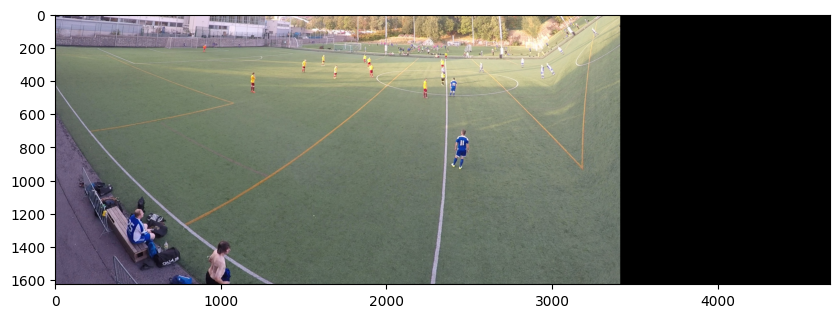

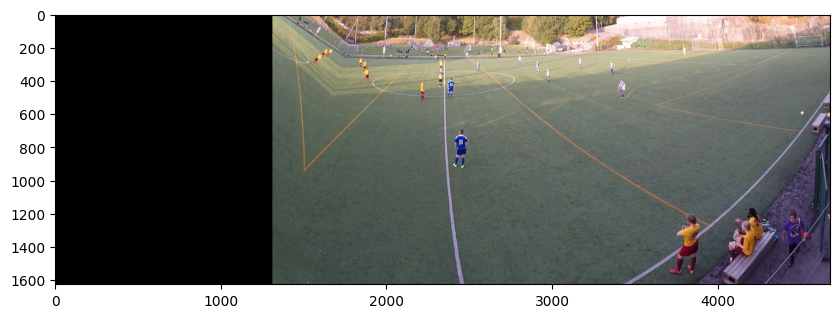

In [26]:
timelapser = Timelapser('as_is')
timelapser.initialize(final_corners, final_sizes)

for img, corner in zip(cropped_final_imgs, final_corners):
    timelapser.process_frame(img, corner)
    frame = timelapser.get_frame()
    plot_image(frame, (10,10))

In [27]:
seam_finder = SeamFinder(finder="dp_color")

seam_masks = seam_finder.find(cropped_low_imgs, low_corners, cropped_low_masks)
seam_masks = [seam_finder.resize(seam_mask, mask) for seam_mask, mask in zip(seam_masks, cropped_final_masks)]

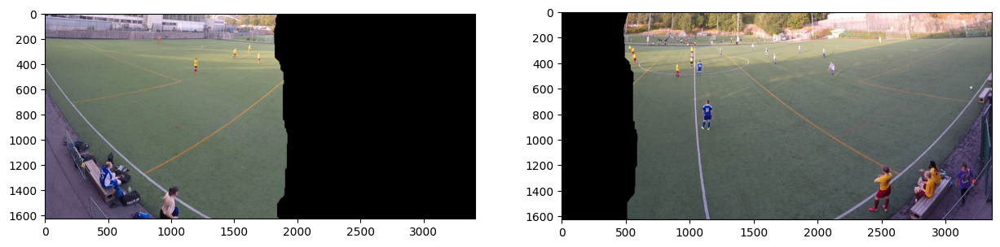

In [28]:
seam_masks_plots = [SeamFinder.draw_seam_mask(img, seam_mask) for img, seam_mask in zip(cropped_final_imgs, seam_masks)]
plot_images(seam_masks_plots, (15,10))

In [29]:
compensator = ExposureErrorCompensator()

compensator.feed(low_corners, cropped_low_imgs, cropped_low_masks)

compensated_imgs = [compensator.apply(idx, corner, img, mask) 
                    for idx, (img, mask, corner) 
                    in enumerate(zip(cropped_final_imgs, cropped_final_masks, final_corners))]

In [30]:
blender = Blender()
blender.prepare(final_corners, final_sizes)
for img, mask, corner in zip(compensated_imgs, seam_masks, final_corners):
    blender.feed(img, mask, corner)
panorama, _ = blender.blend()

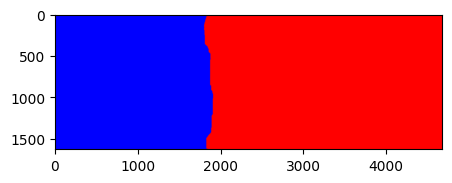

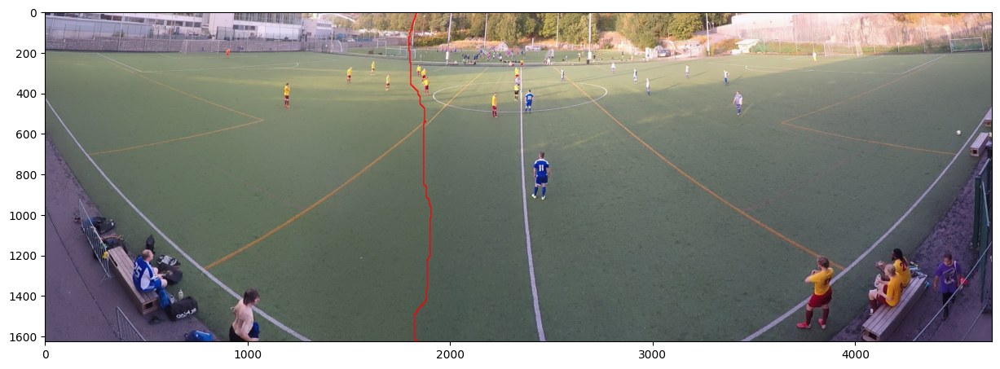

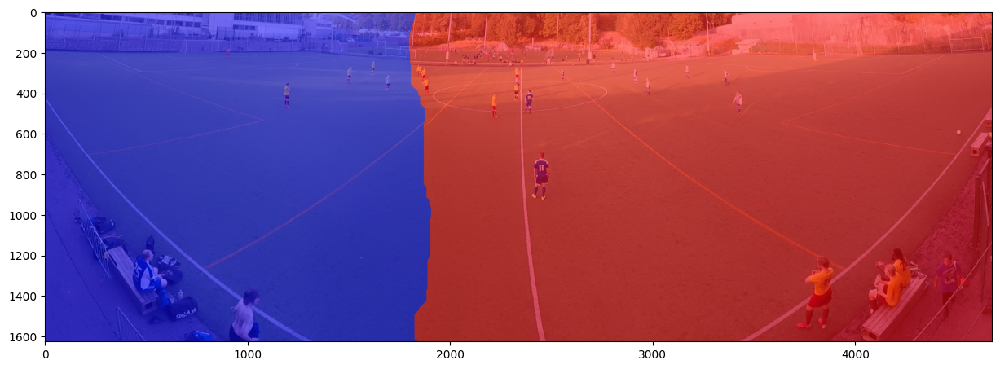

In [31]:
blended_seam_masks = seam_finder.blend_seam_masks(seam_masks, final_corners, final_sizes)
plot_image(blended_seam_masks, (5,5))
plot_image(seam_finder.draw_seam_lines(panorama, blended_seam_masks, linesize=3), (15,10))
plot_image(seam_finder.draw_seam_polygons(panorama, blended_seam_masks), (15,10))

In [32]:
panorama.shape

(1626, 4677, 3)

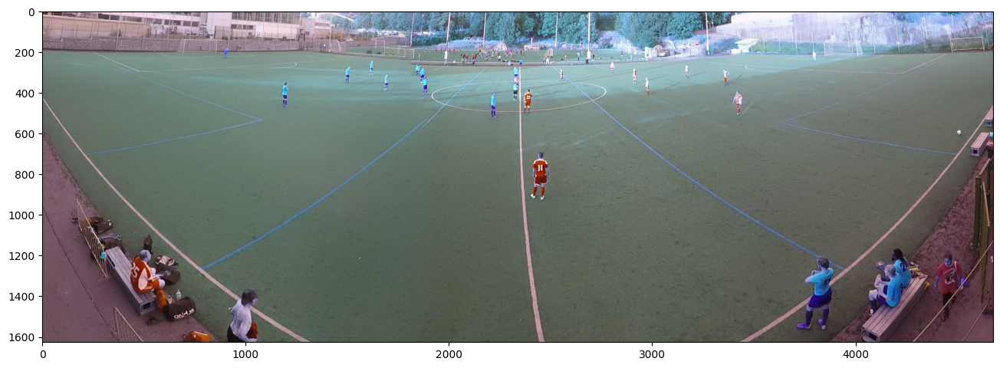

In [33]:
plt.figure(figsize=(16, 16))
plt.imshow(panorama)
plt.show()

1626
4677
3


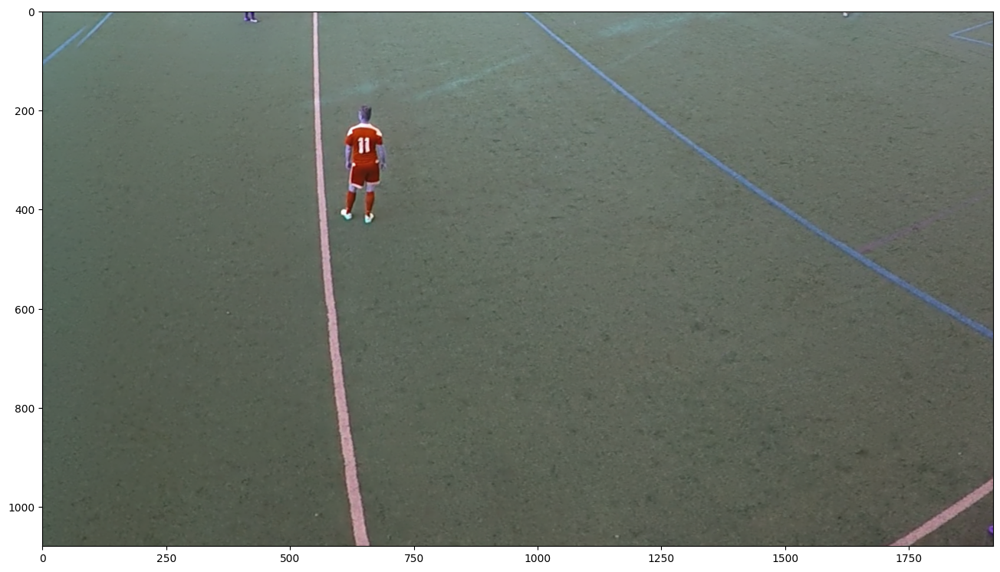

In [54]:
h, w, d = panorama.shape
print(h)
print(w)
print(d)

final_height, final_width = 1080, 1920
x, y = 1800, 500
crop_img = panorama[y:y+final_height,x:final_width+x]
plt.figure(figsize=(16,16))
plt.imshow(crop_img)
plt.show()